In [8]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from hloc.utils.read_write_model import read_points3D_binary

In [9]:
hloc_points3Ds = read_points3D_binary('/home/cvnar/Spatial_Contrastive_Loss/outputs/aachen/sfm_superpoint+superglue/points3D.bin')

In [10]:
def get_points_and_colors(points3D_data):
    """Extract 3D points and their RGB colors"""
    points, colors = [], []
    
    for point_id in tqdm(points3D_data):
        point = points3D_data[point_id]
        points.append(point.xyz)
        colors.append(np.array(point.rgb) / 255.0)
    
    return np.array(points), np.array(colors)

def create_3d_visualization(points, colors, view_params, title, point_size=1):
    """Create 3D visualization with specified parameters"""
    fig = plt.figure(figsize=(20, 20))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot points
    scatter = ax.scatter(points[:, 0], points[:, 1], points[:, 2],
                        c=colors, s=point_size)
    
    # Set viewing limits
    ax.set_xlim(view_params['x_min'], view_params['x_max'])
    ax.set_ylim(view_params['y_min'], view_params['y_max'])
    ax.set_zlim(view_params['z_min'], view_params['z_max'])
    
    # Customize appearance
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    ax.view_init(elev=120, azim=-90)
    
    plt.title(title)
    plt.tight_layout()
    plt.show()

In [11]:
points, colors = get_points_and_colors(hloc_points3Ds)

print("Point Cloud Statistics:")
print(f"Total points: {len(points):,}")
print("\nCoordinate Ranges:")
print(f"X: [{points[:, 0].min():.1f}, {points[:, 0].max():.1f}]")
print(f"Y: [{points[:, 1].min():.1f}, {points[:, 1].max():.1f}]")
print(f"Z: [{points[:, 2].min():.1f}, {points[:, 2].max():.1f}]")

  0%|          | 0/1207674 [00:00<?, ?it/s]

Point Cloud Statistics:
Total points: 1,207,674

Coordinate Ranges:
X: [380.1, 1308.1]
Y: [-58.1, 254.0]
Z: [-468.8, 314.1]


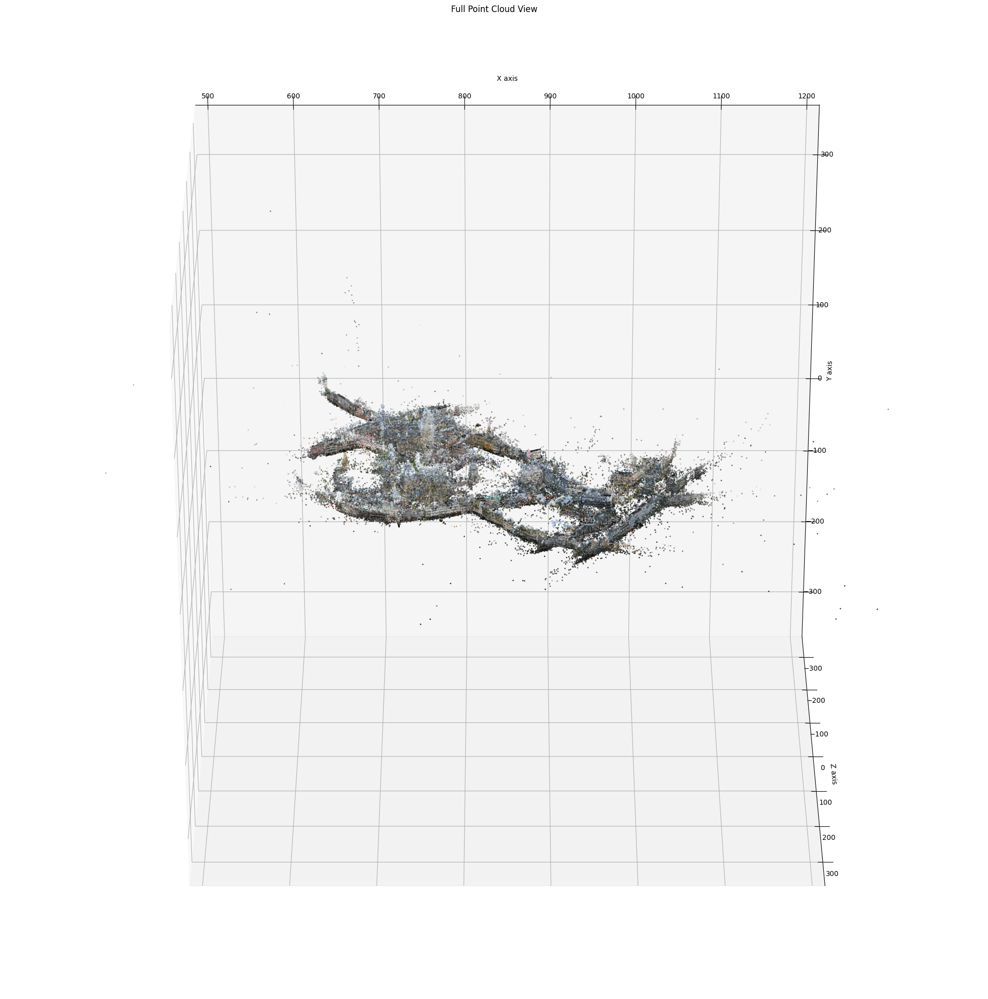

In [12]:
full_view = {
    'x_min': 500, 'x_max': 1200,
    'y_min': -350, 'y_max': 350,
    'z_min': -350, 'z_max': 350
}
create_3d_visualization(points, colors, full_view, 
                       "Full Point Cloud View", point_size=1)

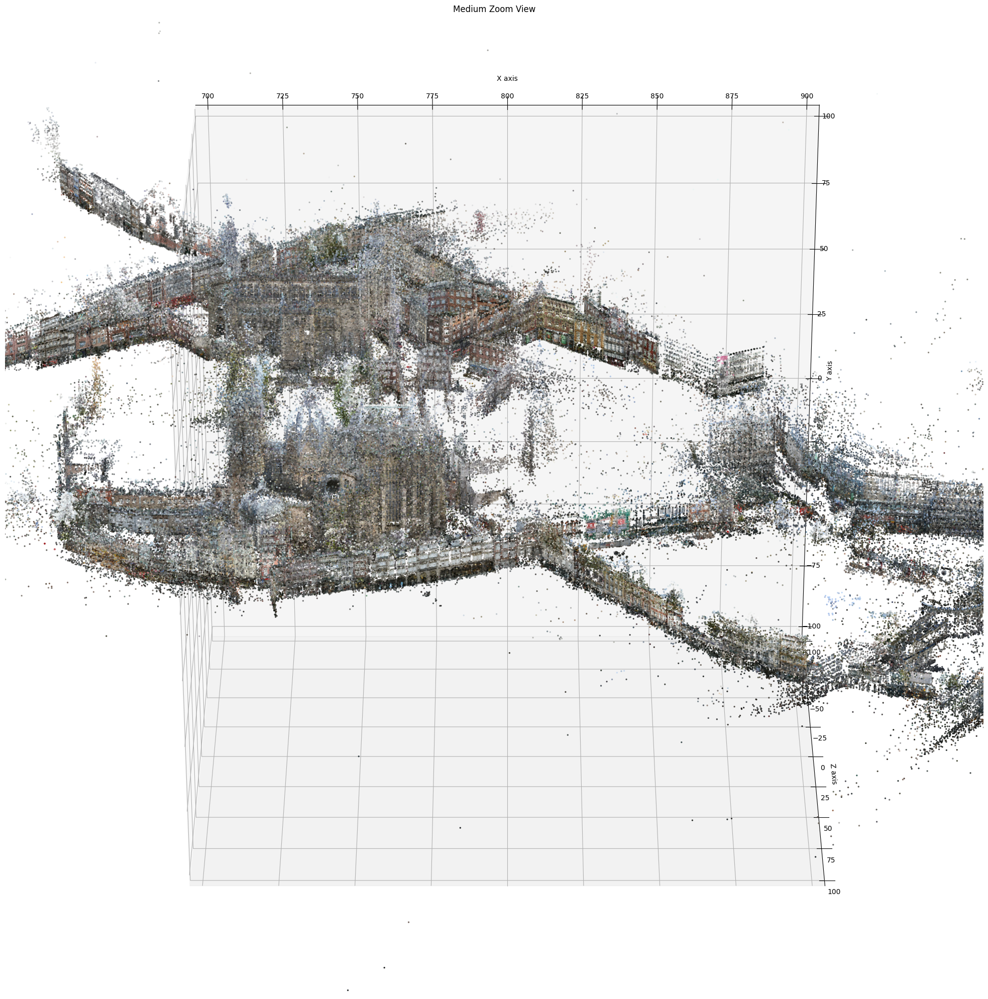

In [13]:
medium_view = {
    'x_min': 700, 'x_max': 900,
    'y_min': -100, 'y_max': 100,
    'z_min': -100, 'z_max': 100
}
create_3d_visualization(points, colors, medium_view,
                       "Medium Zoom View", point_size=2)


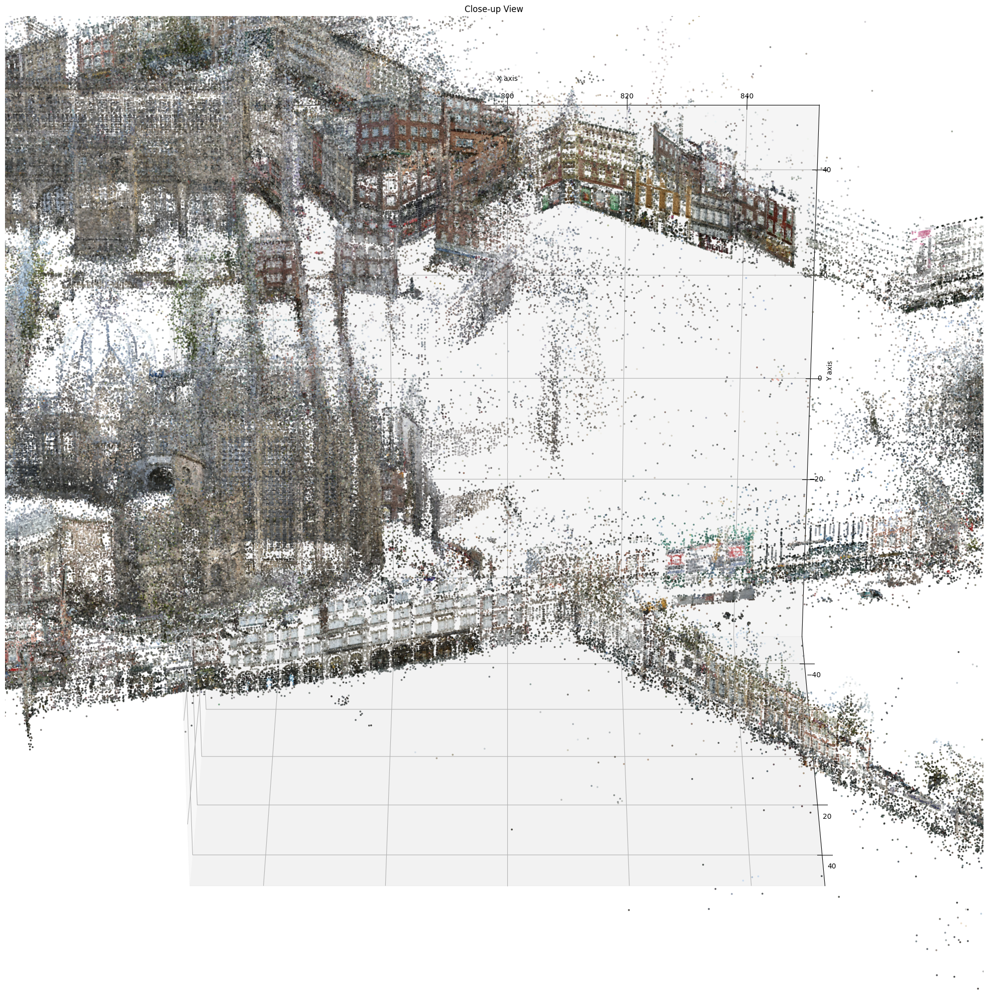

In [14]:
close_view = {
    'x_min': 750, 'x_max': 850,
    'y_min': -50, 'y_max': 50,
    'z_min': -50, 'z_max': 50
}
create_3d_visualization(points, colors, close_view,
                       "Close-up View", point_size=3)

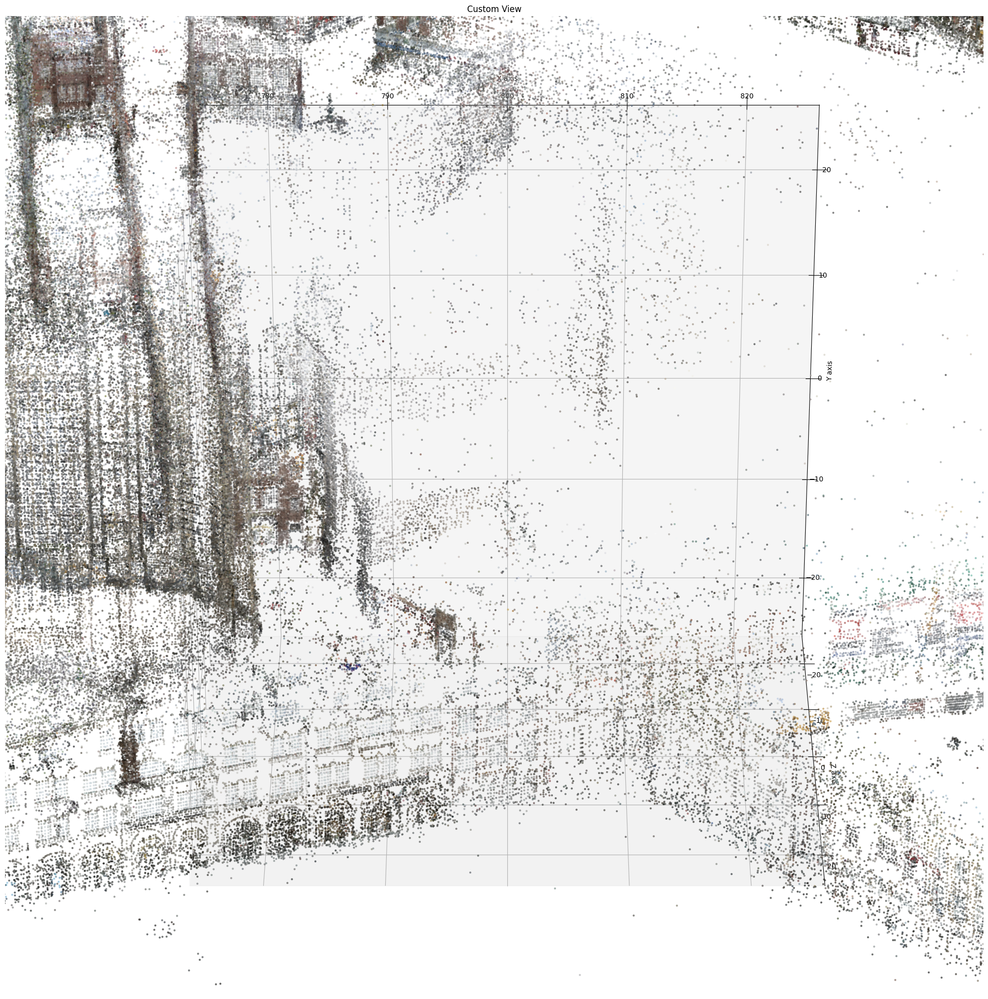

In [15]:
custom_view = {
    'x_min': 775, 'x_max': 825,  # Adjust these values as needed
    'y_min': -25, 'y_max': 25,
    'z_min': -25, 'z_max': 25
}
create_3d_visualization(points, colors, custom_view,
                       "Custom View", point_size=4)